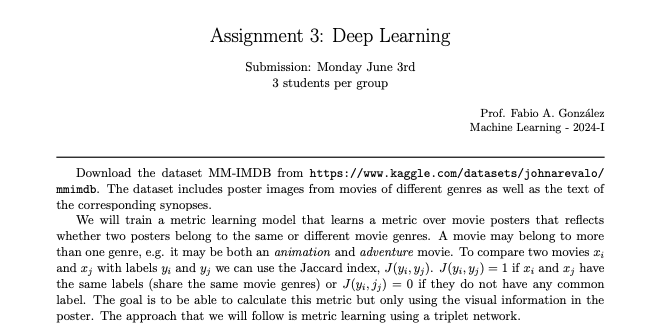

In [6]:
import h5py
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt     

In [20]:
#obtener datos
datapath = '/Users/santiagogonzalez/Documents/datosAM/archive/multimodal_imdb.hdf5'
ds = h5py.File(datapath, 'r')
genres = ds['genres'][()]
imgs = ds['images'][()]
ds.close()

In [21]:
X, y = imgs, genres
#revolver películas, pues parecen estar en orden cronológico
indices = np.arange(X.shape[0])
np.random.shuffle(indices)

X = X[indices]
y = y[indices]


In [22]:
#partición 80+20
i_80 = int(np.floor(len(y)*.8))
X_train = X[:i_80]
y_train = y[:i_80]
X_test = X[i_80+1:]
y_test = y[i_80+1:]

In [7]:
#índice de Jaccard 
def jaccard(y1,y2):
    #coincidencias
    coin = 0
    #disyunciones verdaderas
    dis = 0
    for i in range(y1.shape[0]):
        if y1[i] and y2[i] == True:
            coin +=1 
    for j in range(y1.shape[0]):
        if y1[j] or y2[j] == True:
            dis += 1
    return coin/dis

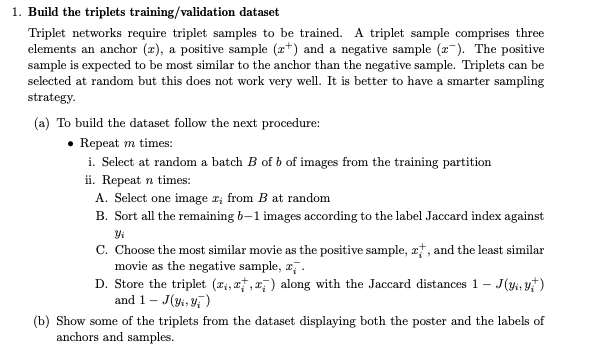

# (a).

In [24]:
#construir triplas-correr esto se demora 15min, por eso guardo
m = 3000
n = 5
b = 6
tripletas = []
#distancias Jaccard
dist_jac = []
#generos tripletas
gen = []
for i in range(m):
    indices = list(range(X_train.shape[0]))
    subset_indices = np.random.choice(indices, size=b, replace=False)
    X_subset = X_train[subset_indices]
    y_subset = y_train[subset_indices]
    for j in range(n):
        X_ancla = X_subset[0]
        y_ancla = y_subset[0]
        X_subset = np.delete(X_subset, 0, axis=0)
        y_subset = np.delete(y_subset, 0, axis=0)
        #similitud respecto al ancla
        sim = []
        for k in range(b-1):
            sim.append(jaccard(y_ancla,y_subset[k]))
        i_min = np.argmin(sim)
        i_max = np.argmax(sim)
        X_mas = X_subset[i_max]
        y_mas = y_subset[i_max]
        y_menos = y_subset[i_min]
        X_menos = X_subset[i_min]
        #tripleta
        tripletas.append([X_ancla,X_mas,X_menos])
        dist_jac.append([1-sim[i_max],1-sim[i_min]])
        gen.append([y_ancla,y_mas,y_menos])
        #poner el ancla al final para volver a empezar
        X_subset = np.append(X_subset, [X_ancla], axis = 0)
        y_subset = np.append(y_subset,[y_ancla], axis = 0)


In [3]:

tripletas = np.load('/Users/santiagogonzalez/Documents/datosAM/assign3Triplas5000.npy')
gen = np.load('/Users/santiagogonzalez/Documents/datosAM/assign3Generos5000.npy')

# (b).

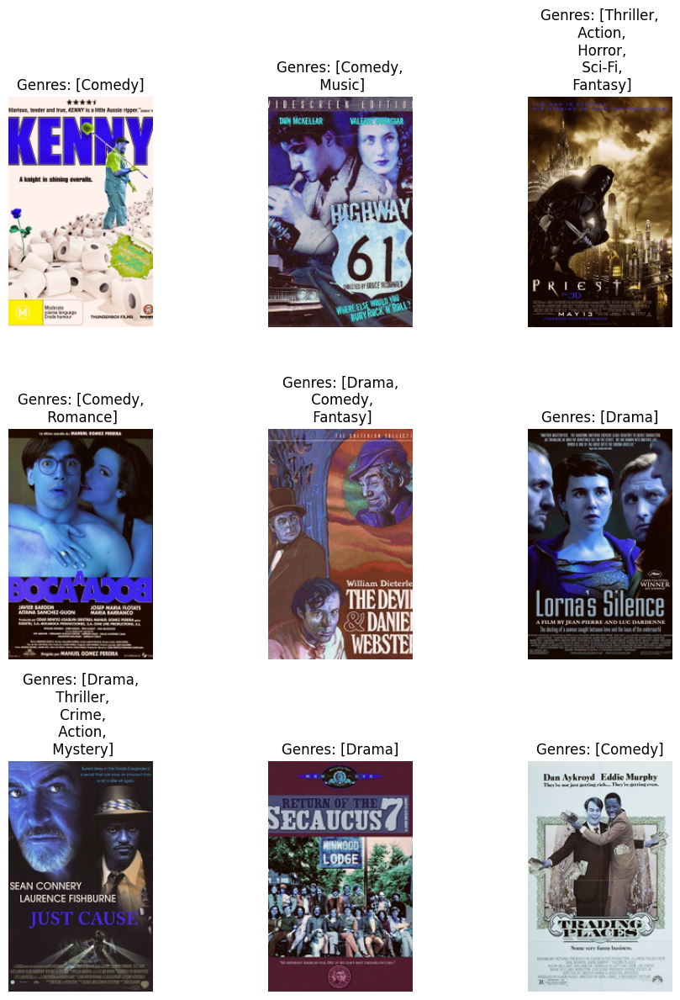

In [4]:
#pasar imágenes a formato correcto (para verlas)
def convert_img(img):
    # Mover el eje de los canales al final
    image = np.transpose(img, (1,2,0))
    min_value = np.min(image)
    max_value = np.max(image)

    # Normaliza la imagen en el rango [0, 255]
    normalized_image = ((image - min_value) / (max_value - min_value)) * 255
    # Convierte la imagen normalizada a uint8
    normalized_image_uint8 = normalized_image.astype(np.uint8)

    return Image.fromarray(normalized_image_uint8)
#para convertir los géneros en texto
genres_list = [
    'Drama',
    'Comedy',
    'Romance',
    'Thriller',
    'Crime',
    'Action',
    'Adventure',
    'Horror',
    'Documentary',
    'Mystery',
    'Sci-Fi',
    'Fantasy',
    'Family',
    'Biography',
    'War',
    'History',
    'Music',
    'Animation',
    'Musical',
    'Western',
    'Sport',
    'Short',
    'Film-Noir',
]

# Obtener algunas imágenes del conjunto de datos
tripleta1 = tripletas[0]
tripleta2 = tripletas[1]
tripleta3 = tripletas[2]
generos1 = gen[0]
generos2 = gen[1]
generos3 = gen[2]

images = np.concatenate((tripleta1,tripleta2,tripleta3))
genrs = np.concatenate((generos1,generos2,generos3))

# Mostrar las imágenes
fig, axes = plt.subplots(3, 3, figsize=(10, 12))
axes = axes.ravel()

for i in range(len(images)):
    axes[i].imshow(convert_img(images[i]))
    axes[i].set_axis_off()
    active_idx = np.where(genrs[i] == 1)[0]
    activated_genrs = [genres_list[idx] for idx in active_idx]
    axes[i].set_title(f"Genres: {activated_genrs}".replace(',', ',\n').replace('\'',''))
    
plt.tight_layout()
plt.show()

In [5]:
#número de triplas, pelis por tripla, canales de color, pos. pixeles
tripletas.shape

(5000, 3, 3, 256, 160)

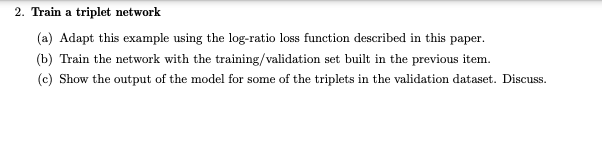

# (a) La idea es implementar la pérdida $l(a,i,j) = 2\ln^2[\frac{d(f_a,f_i)\Delta y_{aj}}{d(f_a,f_j)\Delta y_{ai}}]$ donde $\Delta y_{ai}$ es la distancia Jaccard entre el anclaje y el ejemplo positivo, $\Delta y_{aj}$ es la distancia Jaccard entre el anclaje y el ejemplo negativo, $d(\cdot,\cdot)$ es la distancia euclidiana entre dos vectores, $f_a = f(x_a)$ es el embedding del anclaje, $f_i$ es aquel del ejemplo positivo y $f_j$ es aquel del ejemplo negativo. Con esta pérdida esperamos que al final del entrenamiento el cociente entre distancias de Jaccard se parezca al conciente entre distancias euclidianas en el espacio de embedding. El problema es que si los generos de dos películas son iguales entonces  $\Delta y_{ai}$ puede ser cero, para remediar esto, sumamos un número pequeño al denominador y al numerador dentro del logaritmo. #

In [2]:
import numpy as np
import tensorflow as tf
#pérdida
def custom_loss(y_true, y_pred):
    a = .001
    f_a = y_pred[:, :128]
    f_i = y_pred[:, 128:256]
    f_j = y_pred[:, 256:]
    
    y_ai = tf.cast(y_true[:, 0], tf.float32)+a
    y_aj = tf.cast(y_true[:, 1], tf.float32)+a
    
    d_ai = tf.norm(f_a - f_i, axis=1)
    d_aj = tf.norm(f_a - f_j, axis=1)
    
    
    ratio = (d_ai * y_aj) / (d_aj * y_ai)
    loss = tf.square(tf.math.log(ratio))
    return tf.reduce_mean(loss)  # Promedio de la pérdida sobre el lote


# (b)

In [5]:
#preprocesar imágenes: pasar los canales al final y reescalar a (224x224) para pasarlas al ResNet50 (5min)
def convert_img(img):
    # Mover el eje de los canales al final
    image = np.transpose(img, (1,2,0))
    min_value = np.min(image)
    max_value = np.max(image)

    # Normaliza la imagen en el rango [0, 255]
    normalized_image = ((image - min_value) / (max_value - min_value)) * 255
    # Convierte la imagen normalizada a uint8
    normalized_image_uint8 = normalized_image.astype(np.uint8)

    # Convierte la imagen a una imagen PIL
    pil_image = Image.fromarray(normalized_image_uint8)

    # Redimensiona la imagen a (224,224)
    resized_image = pil_image.resize((224, 224))

    return np.array(resized_image)


In [ ]:
#preprocesar y guardar 5000 triplas
tripl_pros = [[0 for j in range(3) ] for i in range(tripletas.shape[0])]
for i , tripla in enumerate(tripletas):
    for j , peli in enumerate(tripla):
        tripl_pros[i][j] = convert_img(peli)

In [8]:
tripl_pros = np.load('/Users/santiagogonzalez/Documents/datosAM/assign3TriplasProscesadas5000.npy')

In [9]:
tripletas = np.array(tripl_pros)

In [10]:
tripletas.shape

(5000, 3, 224, 224, 3)

In [17]:
import numpy as np
from keras.optimizers import SGD, Adam
import tensorflow as tf
from keras.applications import ResNet50
from keras.layers import Input, Dense, Concatenate, GlobalAveragePooling2D
from keras.models import Model

# Cargar el modelo base ResNet50 sin la capa de clasificación superior
base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

#for layer in base_model.layers:
 #   layer.trainable = False

# Definir las entradas para las tres imágenes
input_a = Input(shape=(224, 224, 3))
input_i = Input(shape=(224, 224, 3))
input_j = Input(shape=(224, 224, 3))

# Procesar cada imagen a través del modelo base ResNet50
feature_a = base_model(input_a)
feature_i = base_model(input_i)
feature_j = base_model(input_j)

# Agregar una capa densa completamente conectada
fc_a = Dense(128, activation='tanh')(feature_a)
fc_i = Dense(128, activation='tanh')(feature_i)
fc_j = Dense(128, activation='tanh')(feature_j)

# Concatenar las salidas
output = Concatenate()([fc_a, fc_i, fc_j])

# Crear el modelo final
model = Model(inputs=[input_a, input_i, input_j], outputs=output)


In [12]:
model.compile(optimizer=SGD(learning_rate=0.0001,
    momentum=0.9,
    nesterov=True,
    ), loss=custom_loss)


In [5]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 2048)      │ 23,587,712 │ input_layer_1[0]… │
│ (Functional)        │                   │            │ input_layer_2[0]… │
│                     │                   │            │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 500)       │  1,024,500 │ resnet50[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 500)       │  1,024,500 │ resnet50[1][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 500)       │  1,024,500 │ resnet50[2][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 1500)      │          0 │ dense[0][0],      │
│ (Concatenate)       │                   │            │ dense_1[0][0],    │
│                     │                   │            │ dense_2[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 26,661,212 (101.70 MB)

 Trainable params: 26,608,092 (101.50 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [13]:
dist_jac = np.load('/Users/santiagogonzalez/Documents/datosAM/assign3Distancias5000.npy')
X_train = tripletas
y_train = dist_jac
# Dividir las tripletas en listas separadas para cada imagen
x_a_list = np.array([tripleta[0] for tripleta in X_train])/255
x_i_list = np.array([tripleta[1] for tripleta in X_train])/255
x_j_list = np.array([tripleta[2] for tripleta in X_train])/255



In [15]:
# y_train debería ser un array con la forma (n_samples, 2) para y_ai y y_aj
X_train.shape, y_train.shape

((5000, 3, 224, 224, 3), (5000, 2))

In [17]:
model.load_weights('model0.001.weights.h5')

/usr/local/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'SGD', because it has 2 variables whereas the saved optimizer has 220 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


In [15]:
model.fit([x_a_list, x_i_list, x_j_list], y_train, epochs=12, batch_size=32)


Epoch 1/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2019s 13s/step - loss: 4.1405
Epoch 2/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2014s 13s/step - loss: 3.9855
Epoch 3/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2017s 13s/step - loss: 3.8304
Epoch 4/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2014s 13s/step - loss: 3.7565
Epoch 5/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2020s 13s/step - loss: 3.4323
Epoch 6/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2010s 13s/step - loss: 3.3695
Epoch 7/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2023s 13s/step - loss: 3.5951
Epoch 8/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2011s 13s/step - loss: 3.7504
Epoch 9/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2022s 13s/step - loss: 3.5674
Epoch 10/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2013s 13s/step - loss: 3.3111
Epoch 11/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2016s 13s/step - loss: 3.4892
Epoch 12/12
157/157 ━━━━━━━━━━━━━━━━━━━━ 2025s 13s/step - loss: 3.5213


In [18]:
model.save('./assign3Modelo5000.keras')

In [ ]:
model = tf.keras.models.load_model('./assign3Modelo5000.keras', custom_objects={'custom_loss': custom_loss})

Probar pérdida, esta pérdida funciona pero no es la única solución....

In [23]:
import numpy as np
import tensorflow as tf

def custom_loss(y_true, y_pred):
    a = .001
    f_a = y_pred[:, :128]
    f_i = y_pred[:, 128:256]
    f_j = y_pred[:, 256:]
    
    y_ai = tf.cast(y_true[:, 0], tf.float32)+a
    y_aj = tf.cast(y_true[:, 1], tf.float32)+a
        
    d_ai = tf.norm(f_a - f_i, axis=1)
    d_aj = tf.norm(f_a - f_j, axis=1)
    
    
    ratio = (d_ai * y_aj) / (d_aj * y_ai)
    loss = tf.square(tf.math.log(ratio))  # Valor absoluto del ratio
    return tf.reduce_mean(loss)  # Promedio de la pérdida sobre el lote

# Datos de prueba
batch_size = 15  # Ejemplo de tamaño de lote
embedding_dim = 128  # Dimensión del embedding

# Simulaciones de salidas del modelo
f_a = np.random.random((batch_size, embedding_dim)).astype(np.float32)
f_i = np.random.random((batch_size, embedding_dim)).astype(np.float32)
f_j = np.random.random((batch_size, embedding_dim)).astype(np.float32)

# Concatenar las salidas simuladas en una sola matriz
y_pred = np.concatenate([f_a, f_i, f_j], axis=1)

# Simulaciones de etiquetas
y_true = y_train[:15]
# Convertir los datos de prueba a tensores de TensorFlow
y_true_tensor = tf.convert_to_tensor(y_true, dtype=tf.float32)
y_pred_tensor = tf.convert_to_tensor(y_pred, dtype=tf.float32)

# Calcular la pérdida
loss_value = custom_loss(y_true_tensor, y_pred_tensor)

# Imprimir la pérdida calculada
print("Calculated Loss:", loss_value.numpy())


Calculated Loss: 9.80025


## c. Resultado para set de validación

En la siguiente tabla se muestran los resultados para el set de validación. Se ve que los cocientes son similares entre sí para la mayoría de casos, la pérdida más grande se ve cuando y_ai/y_aj = 0 pues, como habíamos mencionado ese valor causaba problemas por la forma como la pérdida está definida y tuvimos que alterarla. Aunque estas pérdidas son altas, los cocientes tienen los valores más pequeños cuando y_ai/y_aj = 0.

In [25]:
#para valdiacion
tripletas_val = np.load('/Users/santiagogonzalez/Documents/datosAM/assign3Tripletas15K.npy')
tripletas_val = tripletas_val[:20]
tripl_pros = [[0 for j in range(3) ] for i in range(tripletas_val.shape[0])]
for i , tripla in enumerate(tripletas_val):
    for j , peli in enumerate(tripla):
        tripl_pros[i][j] = convert_img(peli)
X_val = tripl_pros
x_a_list_val = np.array([tripleta[0] for tripleta in X_val])/255
x_i_list_val = np.array([tripleta[1] for tripleta in X_val])/255
x_j_list_val = np.array([tripleta[2] for tripleta in X_val])/255


In [27]:
y_val = np.load('/Users/santiagogonzalez/Documents/datosAM/assign3Distancias15K.npy')
y_val = y_val[:20]

In [28]:
import pandas as pd
#resultado en set de validación
y_pred_val = model.predict([x_a_list_val[:20], x_i_list_val[:20], x_j_list_val[:20]])
d_ai = np.linalg.norm(y_pred_val[:, :128]-y_pred_val[:, 128:256], axis=1)
d_aj = np.linalg.norm(y_pred_val[:, :128]-y_pred_val[:, 256:], axis=1)
losses = []
for i in range(20):
    losses.append(custom_loss(y_val[i].reshape(1,-1), y_pred_val[i].reshape(1,-1)).numpy())
results = pd.DataFrame({'d_ai': d_ai, 'd_aj': d_aj,'ratio d_ai/d_aj':d_ai/d_aj,'y_ai':y_val[:20,0],'y_aj':y_val[:20,1], 'ratio y_ai/y_aj':y_val[:20,0]/y_val[:20,1],'loss': losses})
results

1/1 ━━━━━━━━━━━━━━━━━━━━ 25s 25s/step


,d_ai,d_aj,ratio d_ai/d_aj,y_ai,y_aj,ratio y_ai/y_aj,loss
0,2.000012,22.587618,0.088545,0.000000,1.0,0.000000,20.110796
1,10.937575,20.522802,0.532947,0.666667,1.0,0.666667,0.050340
2,10.287865,13.869903,0.741740,0.750000,1.0,0.750000,0.000130
3,8.786136,16.826838,0.522150,0.500000,1.0,0.500000,0.001793
4,10.298165,18.819004,0.547222,0.500000,1.0,0.500000,0.007965
5,11.781582,13.048590,0.902901,1.000000,1.0,1.000000,0.010433
6,8.431693,16.011627,0.526598,0.500000,1.0,0.500000,0.002584
7,10.948520,16.283907,0.672352,0.600000,1.0,0.600000,0.012811
8,2.000003,22.610067,0.088456,0.000000,1.0,0.000000,20.101849
9,11.743151,21.950832,0.534975,0.600000,1.0,0.600000,0.013311


In [29]:
print(np.mean(losses))

2.0257368


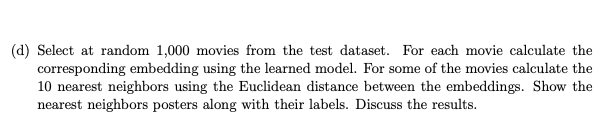

In [15]:
import numpy as np

X_test = np.load('./X_test.npy')
y_test = np.load('./y_test.npy')

In [18]:
from sklearn.neighbors import NearestNeighbors

# Crear un modelo de vecinos más cercanos con distancia euclideana
nn = NearestNeighbors(n_neighbors=10, metric='euclidean')

indices = np.random.randint(X_test.shape[0], size=1002)
test_1000 = X_test[indices]
test_1000.shape
converted_test = np.array([convert_img(img) for img in test_1000])/255
y_test_1000 = y_test[indices]
#para valdiacion
#--embeddings---
split_3 = np.split(converted_test, 3)
test_embeddings = model.predict(split_3).reshape(-1,128)
n_samples  = np.random.randint(1002 ,size=11)
# encontrar 10 vecinos mas cercanos para 10 datos
nn.fit(test_embeddings)
distances, neighbors = nn.kneighbors(test_embeddings[n_samples], n_neighbors=11, return_distance=True)

11/11 ━━━━━━━━━━━━━━━━━━━━ 103s 8s/step


In [32]:
filtered_neighbors = np.array([])
filtered_distances = np.array([])
for i in range(10):
    print(f"Vecinos más cercanos para la muestra {n_samples[i]}:")
    for j, idx in enumerate(neighbors[i]):
        print(f"Vecino {j}: {idx} - Distancia: {distances[i][j]}")
        if idx == n_samples[i]:
            print('Es la misma imagen')
            print(np.delete(neighbors[i], j))
            filtered_neighbors= np.append(filtered_neighbors,np.delete(neighbors[i], j,axis=0))
            filtered_distances= np.append(filtered_distances,np.delete(distances[i], j,axis=0))
filtered_distances = filtered_distances.reshape(10,10)
filtered_neighbors = filtered_neighbors.reshape(10,10).astype(int)


Vecinos más cercanos para la muestra 709:
Vecino 0: 709 - Distancia: 3.3717478231665154e-07
Es la misma imagen
[844 268 967 916 511 349 958 310  31 652]
Vecino 1: 844 - Distancia: 3.3973276615142822
Vecino 2: 268 - Distancia: 3.594590663909912
Vecino 3: 967 - Distancia: 3.6301562786102295
Vecino 4: 916 - Distancia: 3.64331316947937
Vecino 5: 511 - Distancia: 3.7427494525909424
Vecino 6: 349 - Distancia: 3.7602641582489014
Vecino 7: 958 - Distancia: 3.7937116622924805
Vecino 8: 310 - Distancia: 3.8852689266204834
Vecino 9: 31 - Distancia: 3.887477159500122
Vecino 10: 652 - Distancia: 3.896415948867798
Vecinos más cercanos para la muestra 694:
Vecino 0: 694 - Distancia: 3.1539812539449485e-07
Es la misma imagen
[868  37 409 892 994  46 799 517 115 862]
Vecino 1: 868 - Distancia: 5.188986301422119
Vecino 2: 37 - Distancia: 5.290905475616455
Vecino 3: 409 - Distancia: 5.421180725097656
Vecino 4: 892 - Distancia: 5.667737007141113
Vecino 5: 994 - Distancia: 5.742947578430176
Vecino 6: 46 - 

In [33]:
def plot_movies_nn(movie_id):
    fig, axs = plt.subplots(4, 3, figsize=(15, 15))
    axs = axs.flatten()

    for j in range(0,10):
        axs[j+1].set_axis_off()
        axs[j+1].imshow(converted_test[filtered_neighbors[movie_id][j]])
        activated_genrs = [genres_list[idx] for idx in np.where(y_test_1000[filtered_neighbors[movie_id][j]] == 1)[0]]
        axs[j+1].set_title(f"Vecino {j} , Distancia {filtered_distances[movie_id][j]}, Géneros: {activated_genrs}".replace(',', ',\n').replace('\'',''))
    movie = converted_test[n_samples[movie_id]]
    axs[0].set_axis_off()
    axs[0].imshow(movie)
    activated_genrs = [genres_list[idx] for idx in np.where(y_test_1000[n_samples[movie_id]] == 1)[0]]
    axs[0].set_title(f'Película de referencia, Géneros:{activated_genrs}'.replace(',', ',\n').replace('\'',''))
    # Remove empty subplots
    for i in range(11, 12):
        fig.delaxes(axs[i])
    # Adjust spacing between subplots
    fig.tight_layout()

    # Show the plot
    plt.show()

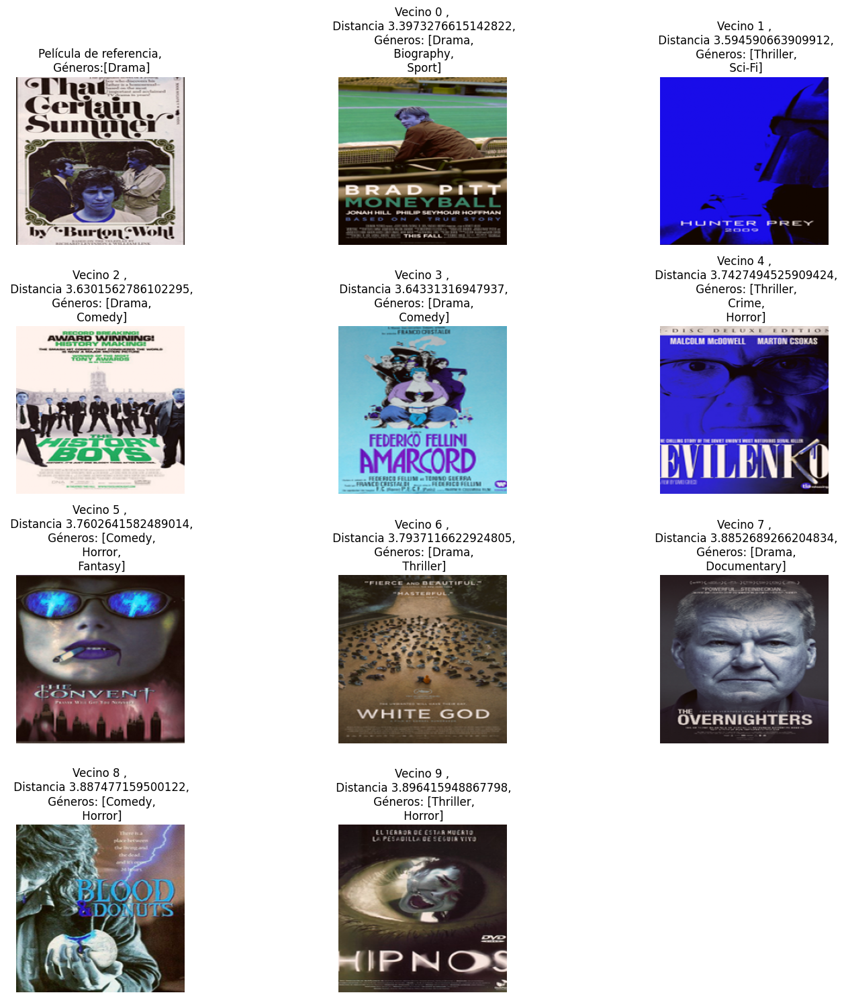

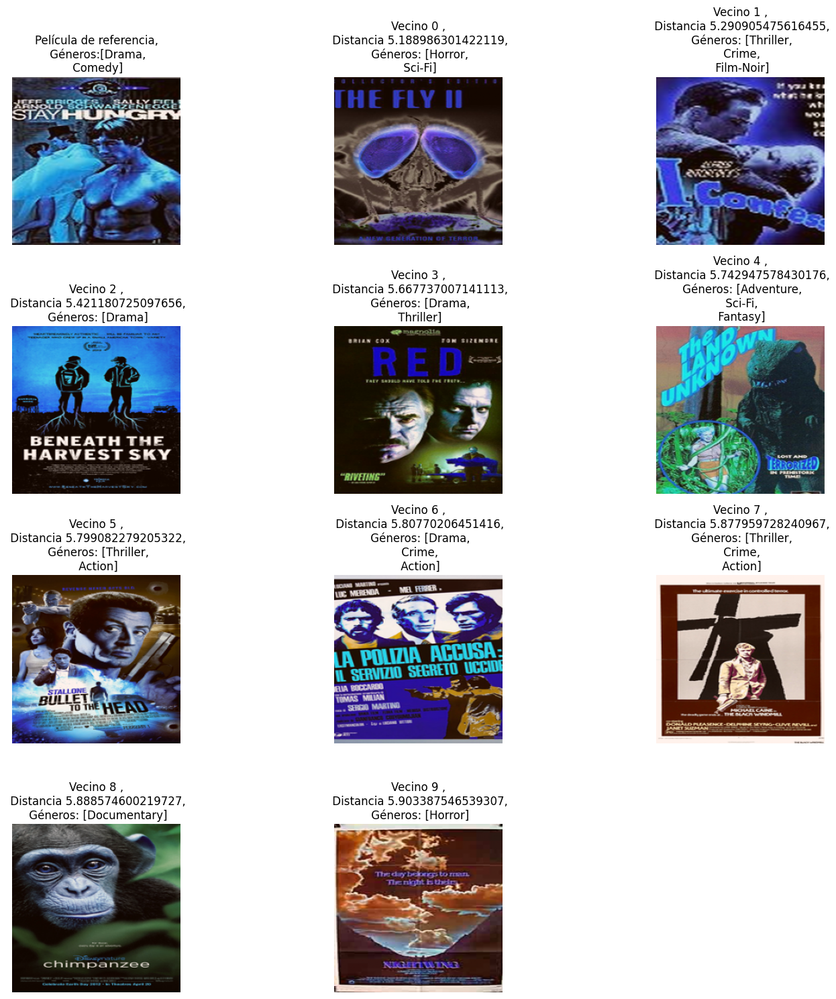

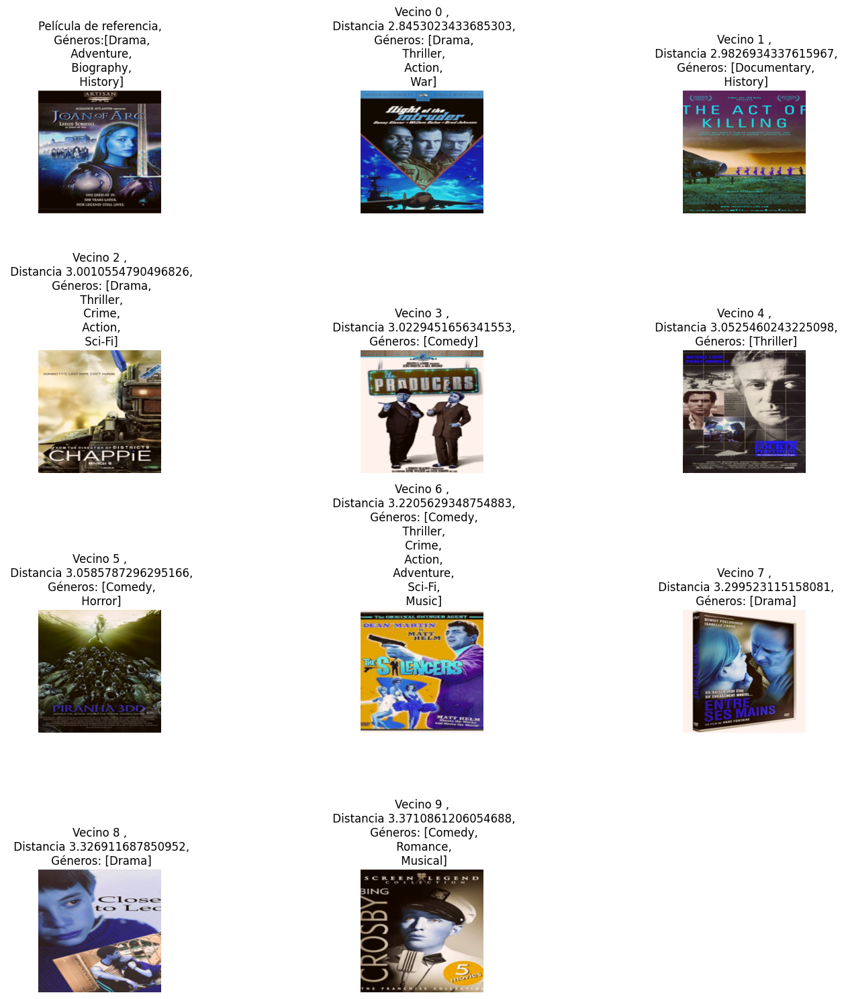

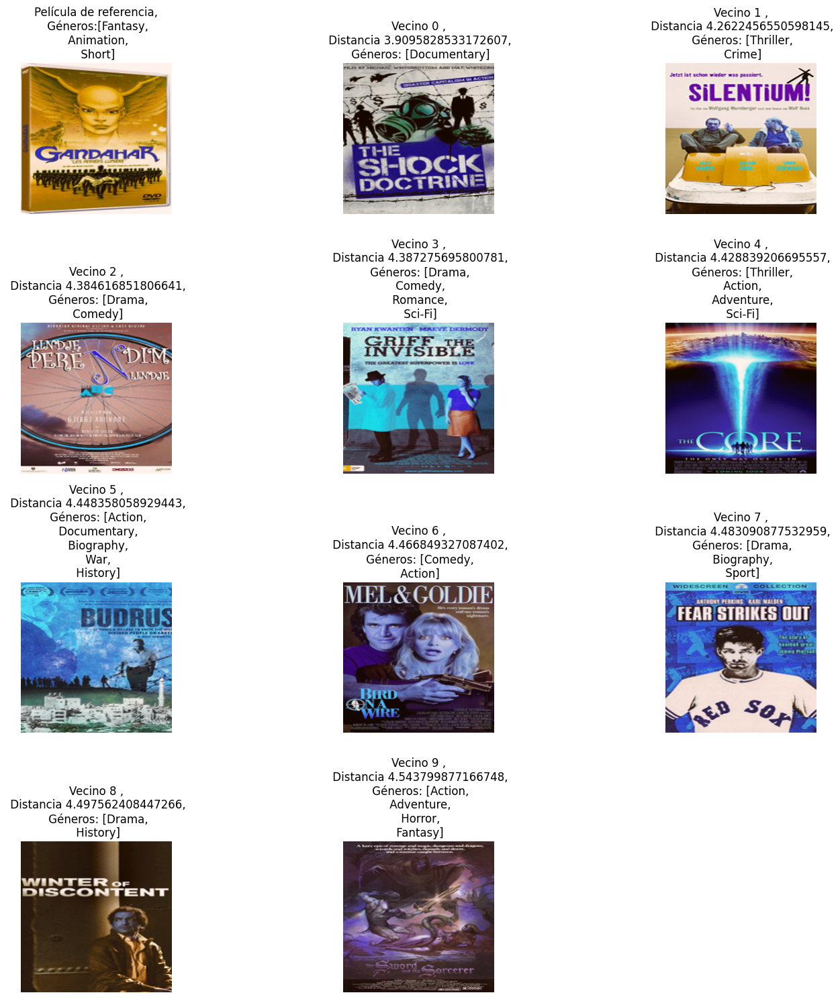

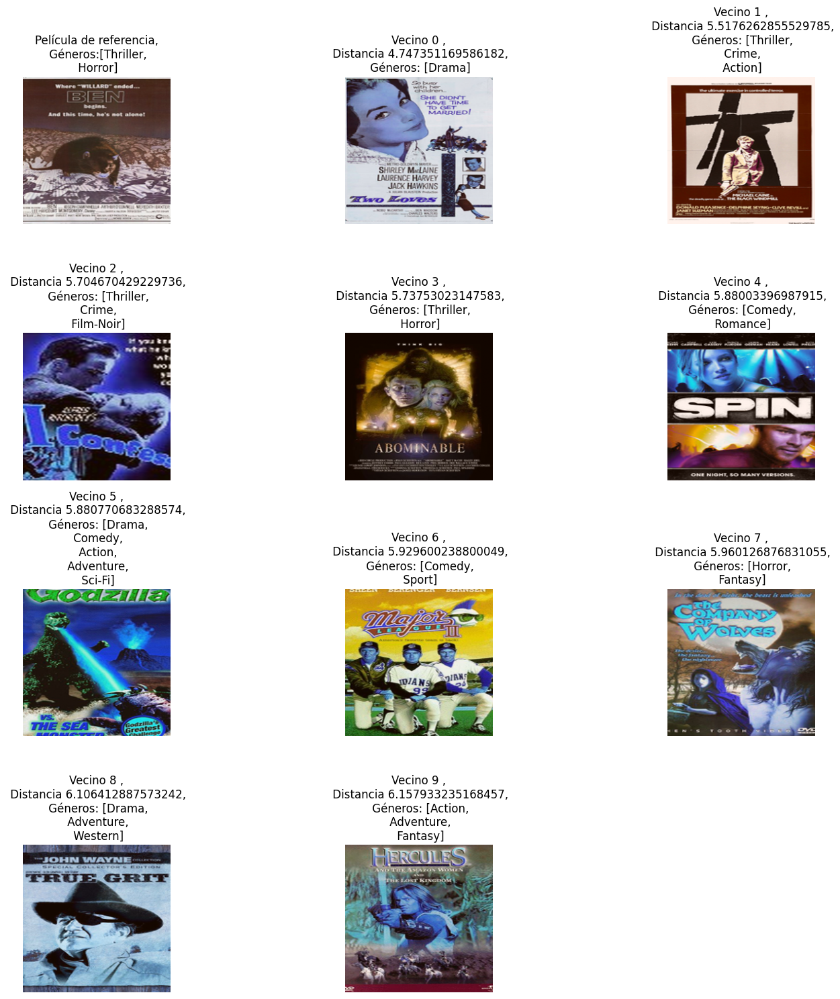

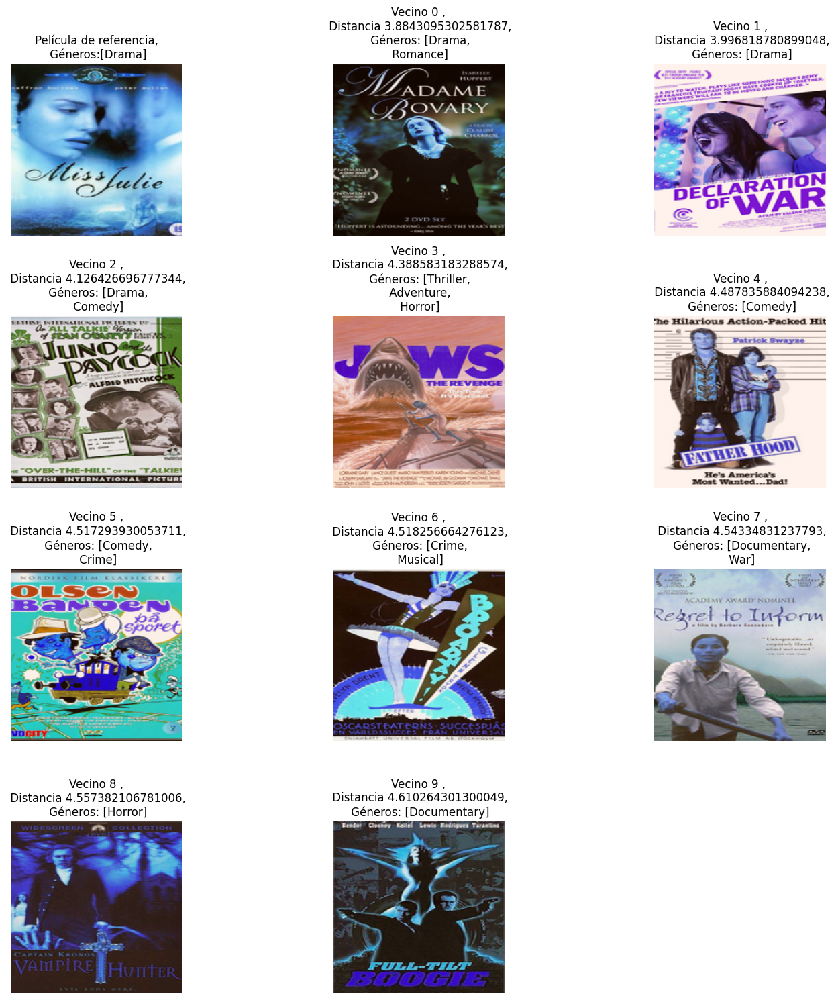

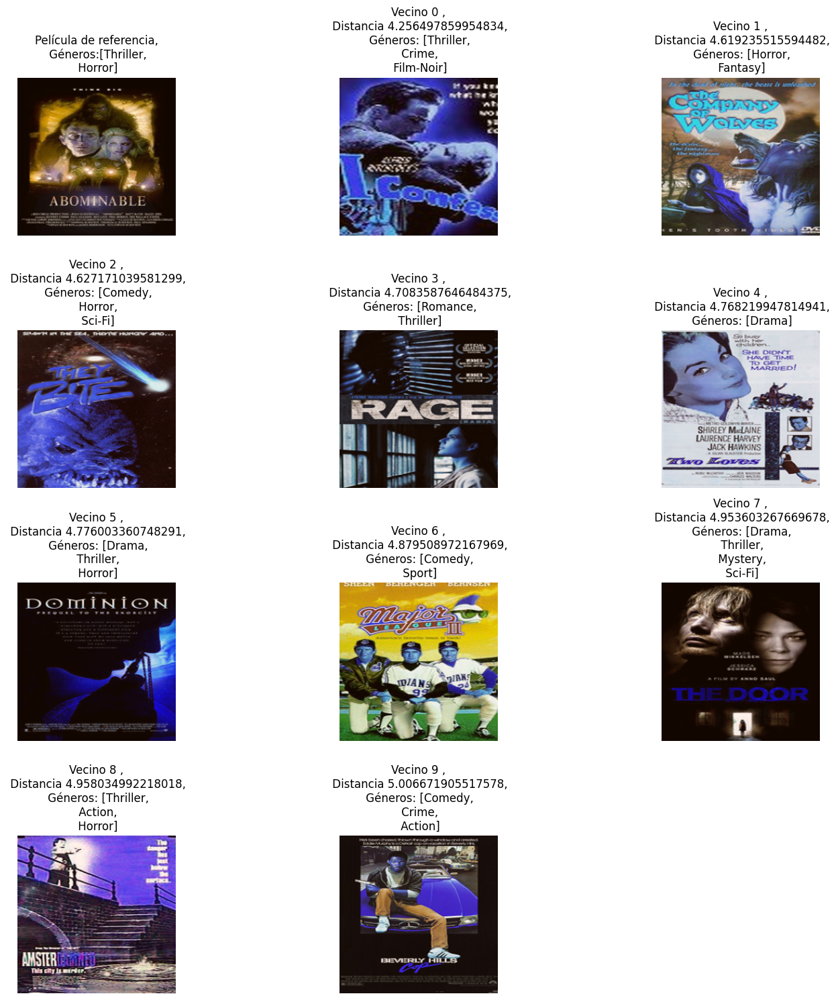

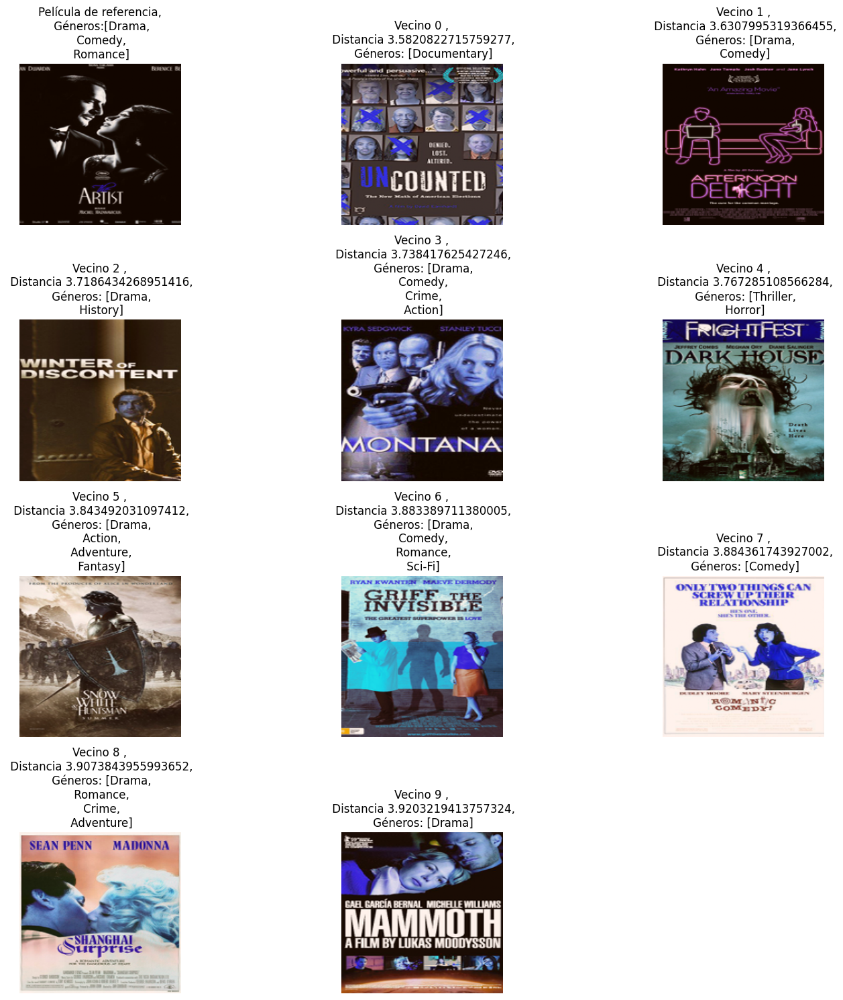

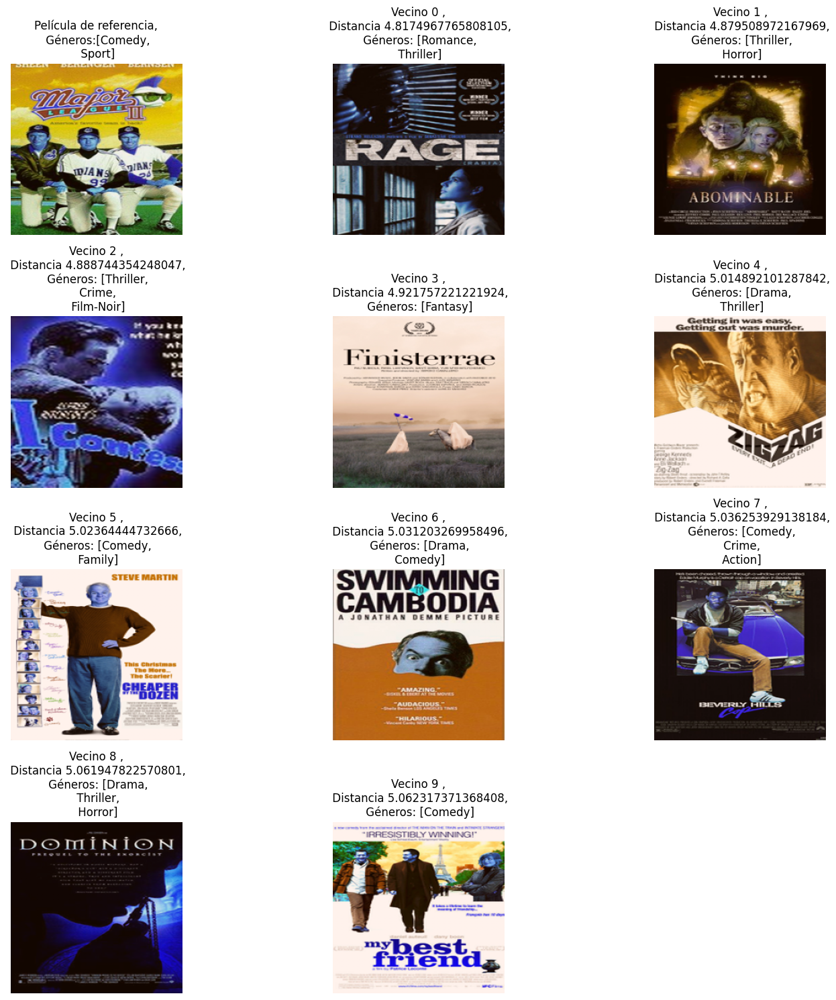

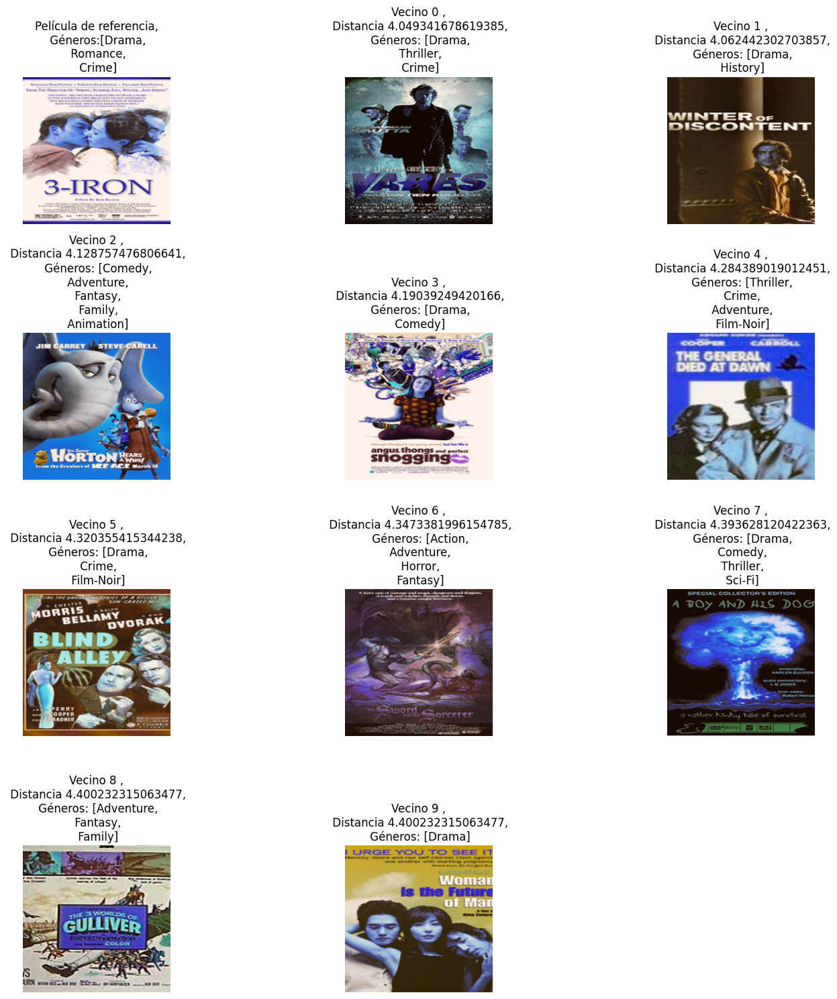

In [34]:
for i in range(10):
    plot_movies_nn(i)

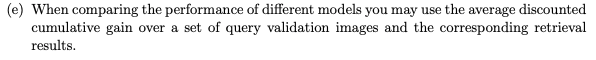

A continuación se calcula el nDCG para un poster ejemplo luego el promedio de nDGC sobre 1000 películas del set de testeo y luego sobre todo el set de testeo

In [19]:
import numpy as np
from keras.optimizers import SGD, Adam
import tensorflow as tf
from keras.applications import ResNet50,VGG16,InceptionV3,DenseNet121
from keras.layers import Input, Dense, Concatenate, GlobalAveragePooling2D
from keras.models import Model

# Cargar el modelo base ResNet50 sin la capa de clasificación superior
base_model_resnet = ResNet50(weights='imagenet', include_top=False, pooling='avg')
base_model_vgg = VGG16(weights='imagenet', include_top=False, pooling='avg')
base_model_inception = InceptionV3(weights='imagenet', include_top=False, pooling='avg')
base_model_densenet = DenseNet121(weights='imagenet', include_top=False, pooling='avg')
#for layer in base_model.layers:
 #   layer.trainable = False

# Definir las entradas para las tres imágenes
input_a = Input(shape=(224, 224, 3))
input_i = Input(shape=(224, 224, 3))
input_j = Input(shape=(224, 224, 3))

# Procesar cada imagen a través del modelo base ResNet50
feature_a = base_model_resnet(input_a)
feature_i = base_model_resnet(input_i)
feature_j = base_model_resnet(input_j)

# Agregar una capa densa completamente conectada
fc_a = Dense(128, activation='tanh')(feature_a)
fc_i = Dense(128, activation='tanh')(feature_i)
fc_j = Dense(128, activation='tanh')(feature_j)

# Concatenar las salidas
output = Concatenate()([fc_a, fc_i, fc_j])
model_resnet = Model(inputs=[input_a, input_i, input_j], outputs=output)
model_resnet.compile(optimizer=SGD(learning_rate=0.0001,
    momentum=0.9,
    nesterov=True,
    ), loss=custom_loss)
model_resnet.load_weights('./model0.001.weights.h5')

# Crear el modelo vgg
feature_a = base_model_vgg(input_a)
feature_i = base_model_vgg(input_i)
feature_j = base_model_vgg(input_j)

# Agregar una capa densa completamente conectada
fc_a = Dense(128, activation='tanh')(feature_a)
fc_i = Dense(128, activation='tanh')(feature_i)
fc_j = Dense(128, activation='tanh')(feature_j)
model_vgg = Model(inputs=[input_a, input_i, input_j], outputs=output)
model_vgg.compile(optimizer=SGD(learning_rate=0.0001,
    momentum=0.9,
    nesterov=True,
    ), loss=custom_loss)

# Crear el modelo inception
feature_a = base_model_inception(input_a)
feature_i = base_model_inception(input_i)
feature_j = base_model_inception(input_j)

# Agregar una capa densa completamente conectada
fc_a = Dense(128, activation='tanh')(feature_a)
fc_i = Dense(128, activation='tanh')(feature_i)
fc_j = Dense(128, activation='tanh')(feature_j)
model_inception = Model(inputs=[input_a, input_i, input_j], outputs=output)
model_inception.compile(optimizer=SGD(learning_rate=0.0001,
    momentum=0.9,
    nesterov=True,
    ), loss=custom_loss)

# Crear el modelo densenet
feature_a = base_model_densenet(input_a)
feature_i = base_model_densenet(input_i)
feature_j = base_model_densenet(input_j)

# Agregar una capa densa completamente conectada
fc_a = Dense(128, activation='tanh')(feature_a)
fc_i = Dense(128, activation='tanh')(feature_i)
fc_j = Dense(128, activation='tanh')(feature_j)
model_densenet = Model(inputs=[input_a, input_i, input_j], outputs=output)
model_densenet.compile(optimizer=SGD(learning_rate=0.0001,
    momentum=0.9,
    nesterov=True,
    ), loss=custom_loss)



c:\Users\acmor\miniconda3\envs\mlcourse\Lib\site-packages\keras\src\saving\saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'SGD', because it has 2 variables whereas the saved optimizer has 220 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


In [20]:
def adcg(yq,y):
    dists=[]
    for i in range(y.shape[0]):
        dist_i = 2-jaccard(yq,y[i])
        dists.append(dist_i)
    dists = np.array(dists)
    r_i = -np.log2(dists)
    indices = np.arange(1, y.shape[0]+1)
    all = np.divide(2**r_i,np.log2(indices+1))
    return all.sum()

In [ ]:
y_test_movie = y_test_1000[n_samples[0]]
adcg_ = adcg(y_test_movie,y_test_1000[filtered_neighbors[0][1:]])
print(f"ADCG para la película de referencia: {adcg_}")

In [22]:
# para el set de testeo sampleado (1000 ejemplos)
nn = NearestNeighbors(n_neighbors=10, metric='euclidean')
nn.fit(test_embeddings)
distances_1000, neighbors_1000 = nn.kneighbors(test_embeddings, n_neighbors=11, return_distance=True)
filtered_neighbors_1000 = np.array([])
filtered_distances_1000 = np.array([])
for i in range(1002):
    for j, idx in enumerate(neighbors_1000[i]):
        if idx == i:
            filtered_neighbors_1000= np.append(filtered_neighbors_1000,np.delete(neighbors_1000[i], j))
            filtered_distances_1000= np.append(filtered_distances_1000,np.delete(distances_1000[i], j))
filtered_distances_1000 = filtered_distances_1000.reshape(1002,10)
filtered_neighbors_1000 = filtered_neighbors_1000.reshape(1002,10).astype(int)
adcg_list = []
for i in range(1002):
    for j in range(0,10):
        adcg_i = adcg(y_test_1000[i],y_test_1000[filtered_neighbors_1000[j]])
        adcg_list.append(adcg_i)
print(f"ADCG promedio para el set de testeo de 1000 ejemplos: {np.mean(adcg_list)}")

ADCG promedio para el set de testeo de 1000 ejemplos: 2.5582611379134375


In [23]:
from sklearn.neighbors import NearestNeighbors
#para todo el set de testeo
#calcular vecinos mas cercanos para todos
nn = NearestNeighbors(n_neighbors=11, metric='euclidean')
#splitable
X_test = np.append(X_test,[X_test[-2,:,:,:]],axis=0)
X_test = np.append(X_test,[X_test[-1,:,:,:]],axis=0)
#
y_test = np.append(y_test,[y_test[-2,:]],axis=0)
y_test = np.append(y_test,[y_test[-1,:]],axis=0)

converted_test_all = np.array([convert_img(img) for img in X_test])/255
split_ = np.split(converted_test_all,3)


In [24]:
test_embeddings_all_resnet = model_resnet.predict(split_).reshape(-1,128)
nn.fit(test_embeddings_all_resnet)
distances_all, neighbors_all = nn.kneighbors(test_embeddings_all_resnet, n_neighbors=11, return_distance=True)

55/55 ━━━━━━━━━━━━━━━━━━━━ 442s 8s/step


In [28]:
filtered_neighbors_all = np.array([])
filtered_distances_all = np.array([])
for i in range(X_test.shape[0]):
    for j, idx in enumerate(neighbors_all[i]):
        if idx == i:
            filtered_neighbors_all= np.append(filtered_neighbors_all,np.delete(neighbors_all[i], j))
            filtered_distances_all= np.append(filtered_distances_all,np.delete(distances_all[i], j))
filtered_distances_all= filtered_distances_all.reshape(X_test.shape[0],10)
filtered_neighbors_all = filtered_neighbors_all.reshape(X_test.shape[0],10).astype(int)
adcg_list_all = []
for i in range(X_test.shape[0]):
    for j in range(1,11):
        adcg_i = adcg(y_test[i],y_test[filtered_neighbors_all[j]])
        adcg_list_all.append(adcg_i)
print(f"ADCG promedio para el set de testeo total resnet: {np.mean(adcg_list_all)}")
adcg_resnet = np.mean(adcg_list_all)

ADCG promedio para el set de testeo total resnet: 2.5470186303426225


In [29]:
test_embeddings_all_vgg = model_vgg.predict(split_).reshape(-1,128)
nn = NearestNeighbors(n_neighbors=10, metric='euclidean')
nn.fit(test_embeddings_all_vgg)
distances_all, neighbors_all = nn.kneighbors(test_embeddings_all_vgg, n_neighbors=11, return_distance=True)
filtered_neighbors_all = np.array([])
filtered_distances_all = np.array([])
for i in range(X_test.shape[0]):
    for j, idx in enumerate(neighbors_all[i]):
        if idx == i:
            filtered_neighbors_all= np.append(filtered_neighbors_all,np.delete(neighbors_all[i], j))
            filtered_distances_all= np.append(filtered_distances_all,np.delete(distances_all[i], j))
filtered_distances_all= filtered_distances_all.reshape(X_test.shape[0],10)
filtered_neighbors_all = filtered_neighbors_all.reshape(X_test.shape[0],10).astype(int)
adcg_list_all = []
for i in range(X_test.shape[0]):
    for j in range(1,11):
        adcg_i = adcg(y_test[i],y_test[filtered_neighbors_all[j]])
        adcg_list_all.append(adcg_i)
print(f"ADCG promedio para el set de testeo total vgg: {np.mean(adcg_list_all)}")
adcg_vgg = np.mean(adcg_list_all)

55/55 ━━━━━━━━━━━━━━━━━━━━ 427s 8s/step
ADCG promedio para el set de testeo total vgg: 2.5470186303426225


In [30]:
test_embeddings_all_inception = model_inception.predict(split_).reshape(-1,128)
nn = NearestNeighbors(n_neighbors=10, metric='euclidean')
nn.fit(test_embeddings_all_inception)
distances_all, neighbors_all = nn.kneighbors(test_embeddings_all_inception, n_neighbors=11, return_distance=True)
filtered_neighbors_all = np.array([])
filtered_distances_all = np.array([])
for i in range(X_test.shape[0]):
    for j, idx in enumerate(neighbors_all[i]):
        if idx == i:
            filtered_neighbors_all= np.append(filtered_neighbors_all,np.delete(neighbors_all[i], j))
            filtered_distances_all= np.append(filtered_distances_all,np.delete(distances_all[i], j))
filtered_distances_all= filtered_distances_all.reshape(X_test.shape[0],10)
filtered_neighbors_all = filtered_neighbors_all.reshape(X_test.shape[0],10).astype(int)
adcg_list_all = []
for i in range(X_test.shape[0]):
    for j in range(1,11):
        adcg_i = adcg(y_test[i],y_test[filtered_neighbors_all[j]])
        adcg_list_all.append(adcg_i)
print(f"ADCG promedio para el set de testeo total: {np.mean(adcg_list_all)}")
adcg_inception = np.mean(adcg_list_all)

55/55 ━━━━━━━━━━━━━━━━━━━━ 425s 7s/step
ADCG promedio para el set de testeo total: 2.5470186303426225


In [31]:
test_embeddings_all_densenet = model_densenet.predict(split_).reshape(-1,128)
nn = NearestNeighbors(n_neighbors=10, metric='euclidean')
nn.fit(test_embeddings_all_densenet)
distances_all, neighbors_all = nn.kneighbors(test_embeddings_all_densenet, n_neighbors=11, return_distance=True)
filtered_neighbors_all = np.array([])
filtered_distances_all = np.array([])
for i in range(X_test.shape[0]):
    for j, idx in enumerate(neighbors_all[i]):
        if idx == i:
            filtered_neighbors_all= np.append(filtered_neighbors_all,np.delete(neighbors_all[i], j))
            filtered_distances_all= np.append(filtered_distances_all,np.delete(distances_all[i], j))
filtered_distances_all= filtered_distances_all.reshape(X_test.shape[0],10)
filtered_neighbors_all = filtered_neighbors_all.reshape(X_test.shape[0],10).astype(int)
adcg_list_all = []
for i in range(X_test.shape[0]):
    for j in range(1,11):
        adcg_i = adcg(y_test[i],y_test[filtered_neighbors_all[j]])
        adcg_list_all.append(adcg_i)
print(f"ADCG promedio para el set de testeo total: {np.mean(adcg_list_all)}")
adcg_densenet = np.mean(adcg_list_all)

55/55 ━━━━━━━━━━━━━━━━━━━━ 450s 8s/step
ADCG promedio para el set de testeo total: 2.5470186303426225


In [32]:
import pandas as pd
results = pd.DataFrame({'Modelo': ['ResNet50', 'VGG16', 'InceptionV3', 'DenseNet121'],
                        'ADCG Promedio': [adcg_resnet, adcg_vgg, adcg_inception, adcg_densenet]})
results

,Modelo,ADCG Promedio
0,ResNet50,2.547019
1,VGG16,2.547019
2,InceptionV3,2.547019
3,DenseNet121,2.547019


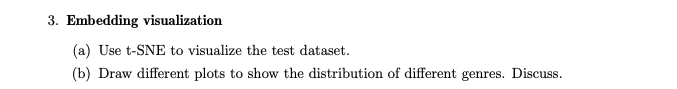

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(test_embeddings_all)

T-SNE reduce la dimensión de las imágenes a dos dimensiones, así se pueden visualizar en una gráfica. En la siguiente gráfica se muestra por cada muestra del set de test un punto y el color está dado aleatoriamente por cada posible combinación, las combinaciones unicas posibles en el set de testeo son 325

In [ ]:
import numpy as np
unique_combinations = np.unique(y_test, axis=0)
color_dict = {}
for i, combination in enumerate(unique_combinations):
    color_dict[tuple(combination)] = np.random.rand(4)  

colors = [color_dict[tuple(combination)] for combination in y_test]

In [ ]:
unique_combinations.shape

In [ ]:
plt.figure(figsize=(10, 10))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, cmap='tab20c', alpha=0.5)
plt.xlabel('Dim 1')
plt.ylabel('Dim 2')
plt.title('t-SNE peliculas')
plt.show()

In [ ]:
import random

def generate_distinct_colors(num_colors):
    colors = []
    for _ in range(num_colors):
        r = random.randint(0, 255)/255
        g = random.randint(0, 255)/255
        b = random.randint(0, 255)/255
        colors.append((r, g, b))
    return np.array(colors)
colors_23 = generate_distinct_colors(23)

fig, axs = plt.subplots(5, 5, figsize=(15, 15))

axs = axs.flatten()
# Create 23 subplots
for j in range(23):
    # Plot something on each subplot
    slicing  = [ i for i in range(len(y_test)) if y_test[i][j]==1]
    axs[j].plot(X_tsne[slicing,0],X_tsne[slicing,1], 'o', color=colors_23[j])
    axs[j].set_title(genres_list[j])

# Remove empty subplots
for i in range(23, 25):
    fig.delaxes(axs[i])

# Adjust spacing between subplots
fig.tight_layout()

# Show the plot
plt.show()

In [ ]:
plt.figure(figsize=(15,15))
for j in range(12):
    # Plot something on each subplot
    slicing  = [ i for i in range(len(y_test[y_test])) if y_test[i][j]==1]
    plt.plot(X_tsne[slicing,0],X_tsne[slicing,1], 'o', color=colors_23[j],label=genres_list[j],alpha=0.5)
    # axs[j].set_title()
plt.legend()

In [ ]:
#contar cuántas veces aparece cada combinación y ordenar
counter = []
for j in range(918):
    indices = np.where(np.all(y_test == unique_combinations[j], axis=1))[0]
    count = len(indices)
    counter.append((count, j))
counter.sort(reverse=True)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
from textwrap import wrap

def generate_distinct_colors(num_colors):
    #hacer n colores distintos
    colors = []
    for _ in range(num_colors):
        r = random.randint(0, 255)/255
        g = random.randint(0, 255)/255
        b = random.randint(0, 255)/255
        colors.append((r, g, b))
    return np.array(colors)
colors_25= generate_distinct_colors(25)

fig, axs = plt.subplots(5, 5, figsize=(25, 25))

axs = axs.flatten()
for j in range(25):
    indices = np.where(np.all(y_test == unique_combinations[counter[j][1]], axis=1))[0]
    indices_names = np.where(unique_combinations[counter[j][1]]==1)
    names = np.array(genres_list)[indices_names]
    axs[j].plot(X_tsne[indices,0],X_tsne[indices,1], 'o', color=colors_25[j])
    # axs[j].legend()
    title = axs[j].set_title("\n".join(wrap(str(names), 20)))
    # axs[j].set_title(str(names))


# Adjust spacing between subplots
fig.tight_layout()
title.set_y(1.05)
# Show the plot
plt.show()